# Data Preparation

In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import random

img1 = cv.imread('data/001.jpg')
img2 = cv.imread('data/002.jpg')
img3 = cv.imread('data/003.jpg')

# Feature Detection

In [ ]:
gray1 = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)
gray2 = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)
gray3 = cv.cvtColor(img3, cv.COLOR_BGR2GRAY)

In [2]:
sift = cv.SIFT_create()

kpts1, dest1 = sift.detectAndCompute(gray1, None)
kpts2, dest2 = sift.detectAndCompute(gray2, None)
kpts3, dest3 = sift.detectAndCompute(gray3, None)

img1_kpts = cv.drawKeypoints(img1, kpts1, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_kpts = cv.drawKeypoints(img2, kpts2, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img3_kpts = cv.drawKeypoints(img3, kpts3, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

### Plot SIFT Keypoints

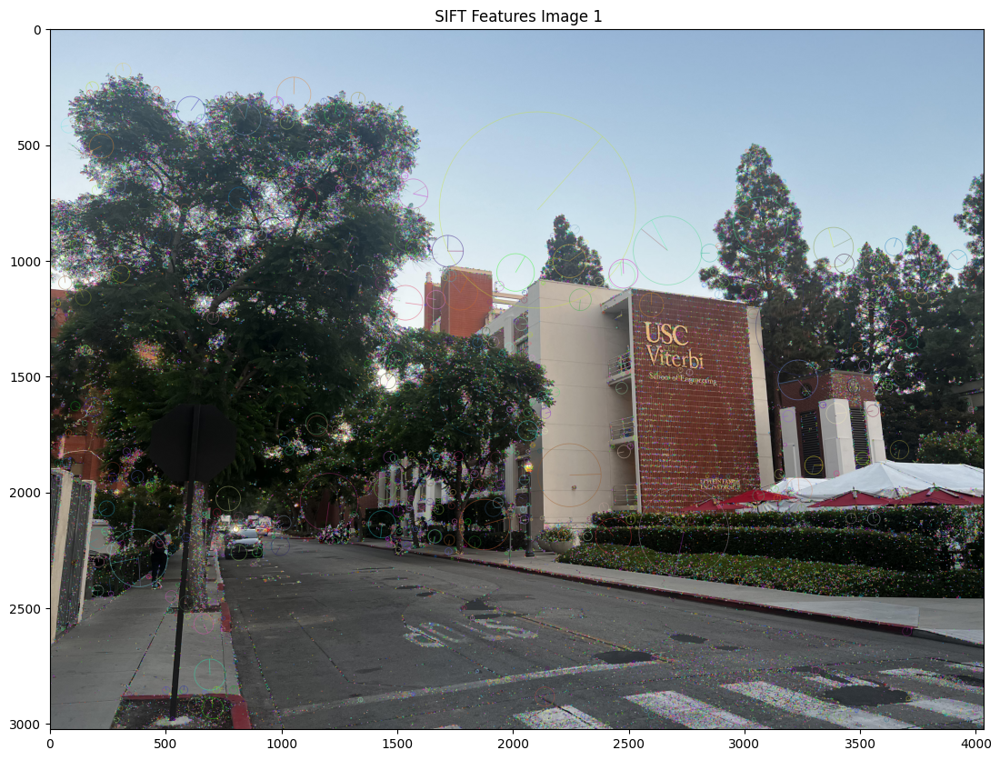

Total number of Features for Image 1:  75295


In [68]:
plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(img1_kpts, cv.COLOR_BGR2RGB))
plt.title(f' SIFT Features Image 1')
plt.show()

print("Total number of Features for Image 1: ", len(kpts1))

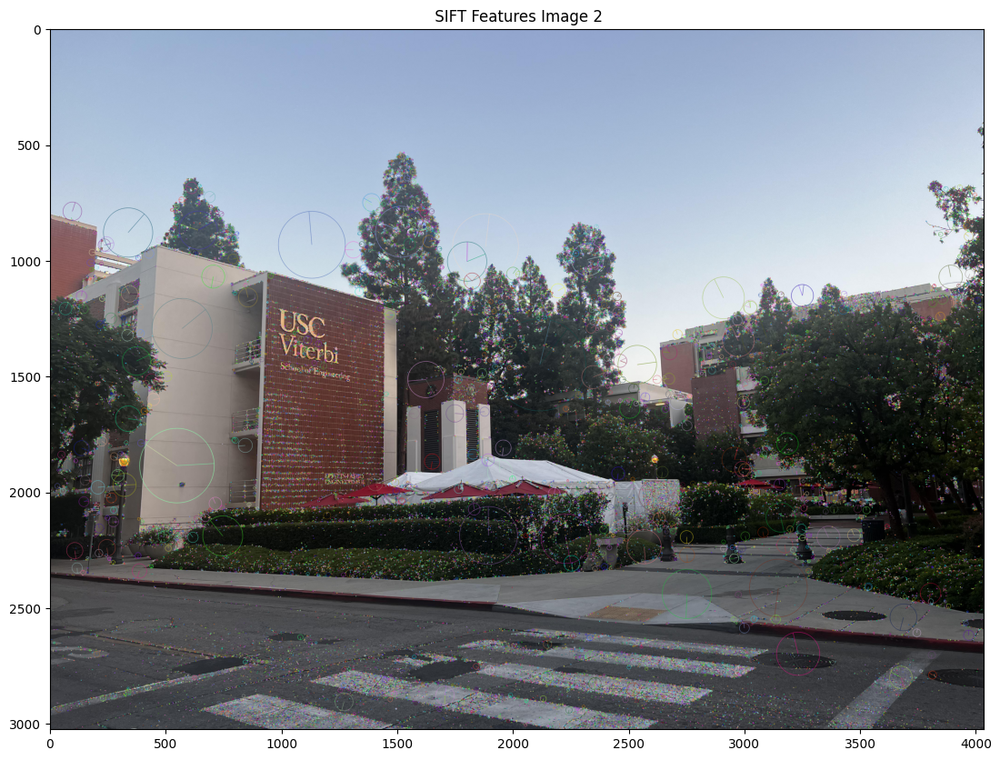

Total number of Features for Image 2:  67155


In [69]:
plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(img3_kpts, cv.COLOR_BGR2RGB))
plt.title(f' SIFT Features Image 2')
plt.show()

print("Total number of Features for Image 2: ", len(kpts2))

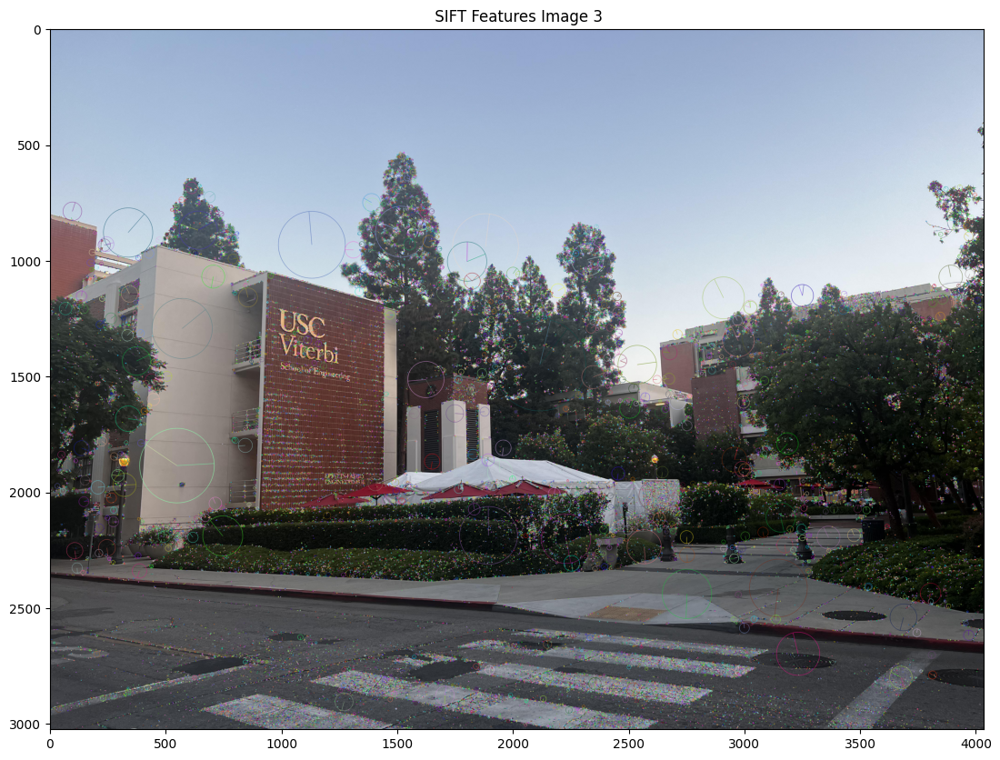

Total number of Features for Image 3:  52663


In [70]:
plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(img3_kpts, cv.COLOR_BGR2RGB))
plt.title(f' SIFT Features Image 3')
plt.show()

print("Total number of Features for Image 3: ", len(kpts3))

# Feature Matching

In [22]:
bf = cv.BFMatcher()

matches_21 = bf.knnMatch(dest2, dest1, k=2)
matches_32 = bf.knnMatch(dest3, dest2, k=2)
matches_31 = bf.knnMatch(dest3, dest1, k=2)

# matches_21_sorted = sorted(matches_21, key=lambda x: x[0].distance)
# matches_32_sorted = sorted(matches_32, key=lambda x: x[0].distance)

good_21 = []
for m, n in matches_21:
    if m.distance < 0.75 * n.distance:
        good_21.append([m, n])

good_32 = []
for m, n in matches_32:
    if m.distance < 0.75 * n.distance:
        good_32.append([m, n])

# good_31 = []
# for m, n in matches_31:
#     if m.distance < 0.75 * n.distance:
#         good_31.append([m, n])

good_21_sorted = sorted(good_21, key=lambda x: x[0].distance)
good_32_sorted = sorted(good_32, key=lambda x: x[0].distance)
# good_31_sorted = sorted(good_31, key=lambda x: x[0].distance)

img_matches_21 = cv.drawMatchesKnn(img2, kpts2, img1, kpts1, good_21_sorted[:10], None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
img_matches_32 = cv.drawMatchesKnn(img3, kpts3, img2, kpts2, good_32_sorted[:10], None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
# img_matches_31 = cv.drawMatchesKnn(img3, kpts3, img1, kpts1, good_32_sorted[:10], None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

### Plot Top 10 Matches

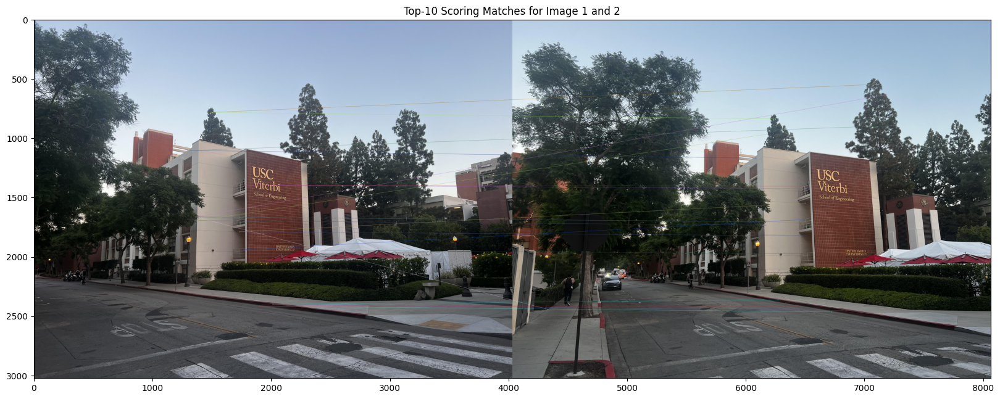

Total number of Matches for Image 1 and 2: 67155
Total number of Good Matches for Image 1 and 2: 9143


In [55]:
plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(img_matches_21, cv.COLOR_BGR2RGB))
plt.title(f'Top-10 Scoring Matches for Image 1 and 2')
plt.show()

print("Total number of Matches for Image 1 and 2:", len(matches_21))
print("Total number of Good Matches for Image 1 and 2:", len(good_21))


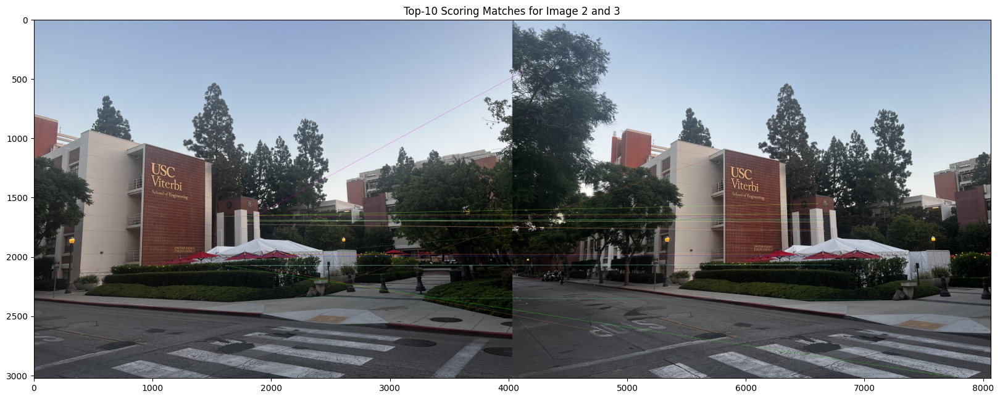

Total number of Matches for Image 2 and 3: 52663
Total number of Good Matches for Image 2 and 3: 8390


In [56]:
plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(img_matches_32, cv.COLOR_BGR2RGB))
plt.title(f'Top-10 Scoring Matches for Image 2 and 3')
plt.show()

print("Total number of Matches for Image 2 and 3:", len(matches_32))
print("Total number of Good Matches for Image 2 and 3:", len(good_32))

# Compute Homography

### Calculate Inlier Matches

In [26]:
src_pts_21 = np.float32([kpts2[m[0].queryIdx].pt for m in good_21_sorted]).reshape(-1, 1, 2)
dst_pts_21 = np.float32([kpts1[m[0].trainIdx].pt for m in good_21_sorted]).reshape(-1, 1, 2)
src_pts_32 = np.float32([kpts3[m[0].queryIdx].pt for m in good_32_sorted]).reshape(-1, 1, 2)
dst_pts_32 = np.float32([kpts2[m[0].trainIdx].pt for m in good_32_sorted]).reshape(-1, 1, 2)

H_21, mask_21 = cv.findHomography(src_pts_21, dst_pts_21, cv.RANSAC, 5.0)
H_32, mask_32 = cv.findHomography(src_pts_32, dst_pts_32, cv.RANSAC, 5.0)

inliers_21 = [m for i, m in enumerate(good_21_sorted) if mask_21[i] == 1]
inliers_32 = [m for i, m in enumerate(good_32_sorted) if mask_32[i] == 1]

sorted_inliers_21 = sorted(inliers_21, key=lambda x: x[0].distance)
sorted_inliers_32 = sorted(inliers_32, key=lambda x: x[0].distance)

inliers_matches_21 = cv.drawMatchesKnn(img2, kpts2, img1, kpts1, sorted_inliers_21[:10], None, matchColor=(0, 255, 0),
                                matchesMask=None,
                                flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
inliers_matches_32 = cv.drawMatchesKnn(img3, kpts3, img2, kpts2, sorted_inliers_32[:10], None, matchColor=(0, 255, 0),
                                matchesMask=None,
                                flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

### Plot Inlier Matches

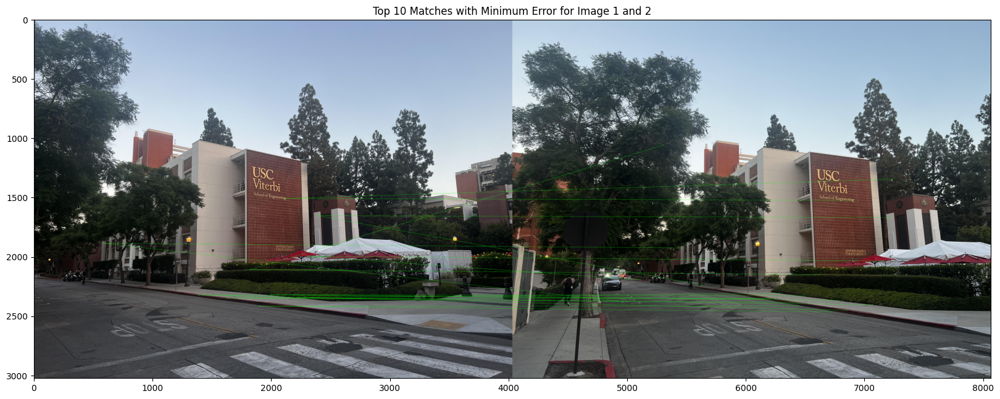

Total number of Inlier Matches for Image 1 and 2: 4338


In [57]:
plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(inliers_matches_21, cv.COLOR_BGR2RGB))
plt.title('Top 10 Matches with Minimum Error for Image 1 and 2')
plt.show()

inlier_count_21 = np.sum(mask_21)
print(f"Total number of Inlier Matches for Image 1 and 2: {inlier_count_21}")

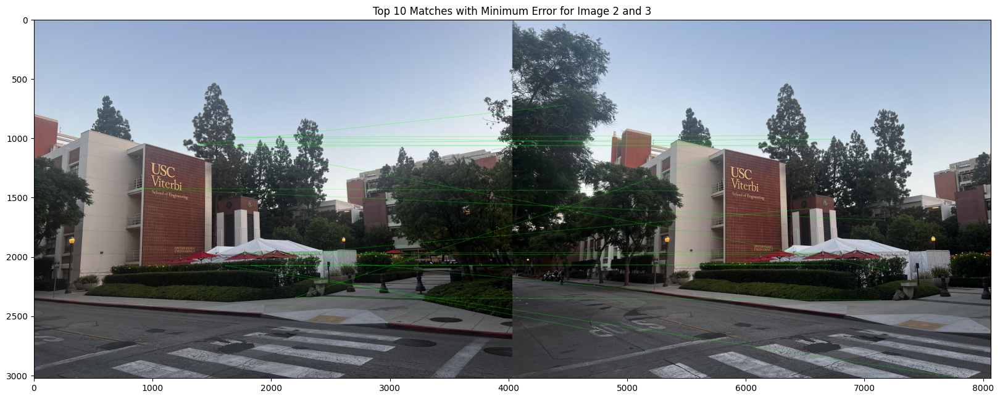

Total number of Inlier Matches for Image 2 and 3: 3879


In [58]:
plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(inliers_matches_32, cv.COLOR_BGR2RGB))
plt.title('Top 10 Matches with Minimum Error for Image 2 and 3')
plt.show()

inlier_count_32 = np.sum(mask_32)
print(f"Total number of Inlier Matches for Image 2 and 3: {inlier_count_32}")

In [60]:
H_cumulative = np.dot(H_32, H_21)

### Homogaphy Matrices

In [64]:
print("Homography between Image 1 and 2:\n\n", H_21, "\n")
print("Homography between Image 2 and 3:\n\n", H_32, "\n")
print("Homography Cumulative:\n\n", H_cumulative)

Homography between Image 1 and 2:

 [[ 6.88735300e-01  1.95287747e-02  9.08758586e+02]
 [-1.47303419e-01  8.57640739e-01  2.85933384e+02]
 [-7.37879528e-05 -7.29262959e-06  1.00000000e+00]] 

Homography between Image 2 and 3:

 [[ 6.51491468e-01  3.79267762e-02  9.91671889e+02]
 [-1.56927306e-01  8.60436810e-01  2.50277738e+02]
 [-8.47948056e-05 -3.56033775e-07  1.00000000e+00]] 

Homography Cumulative:

 [[ 3.69944989e-01  3.80184827e-02  1.59456489e+03]
 [-2.53294141e-01  7.33055881e-01  3.53696310e+02]
 [-1.32136684e-04 -9.25391731e-06  9.22840190e-01]]


# Stitch into a Panorama

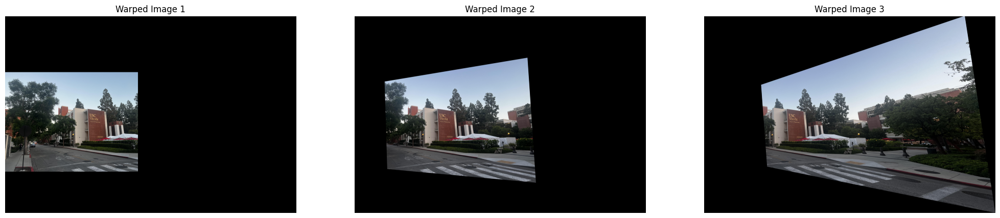

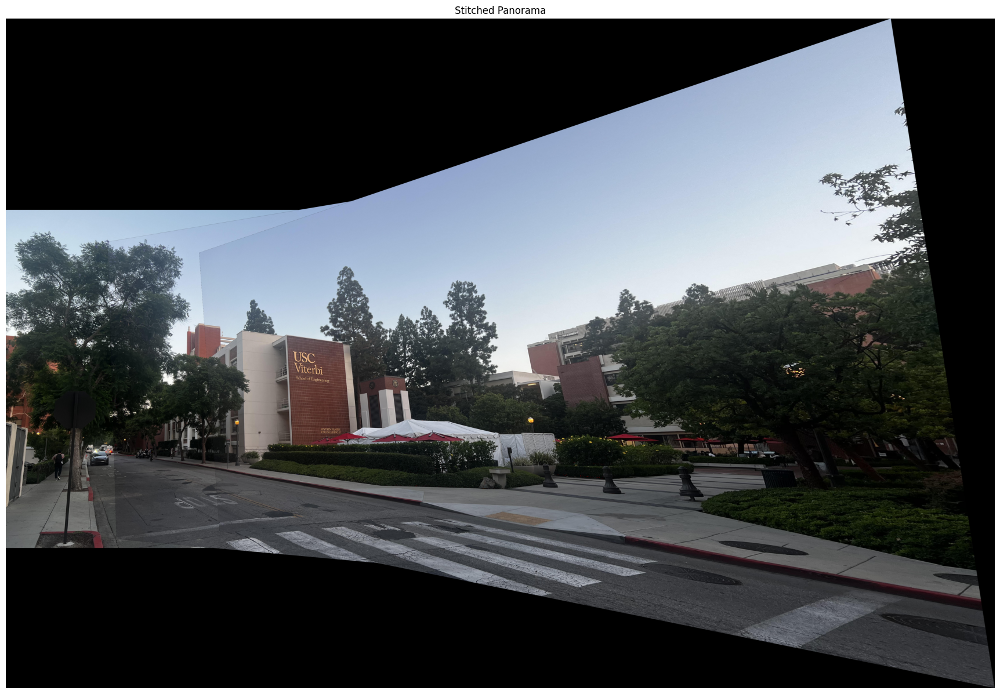

In [67]:
h1, w1 = img1.shape[:2]
h2, w2 = img2.shape[:2]
h3, w3 = img3.shape[:2]

min_x = min_y = 0
max_x = max_y = 0
images = [img1, img2, img3]
homographies = [np.eye(3), H_21, H_cumulative]

for i in range(len(images)):
    h, w = images[i].shape[:2]
    corners = np.array([[0, 0], [w, 0], [w, h], [0, h]], dtype=np.float32).reshape(-1, 1, 2)
    
    transformed_corners = cv.perspectiveTransform(corners, homographies[i])
    
    min_x = min(min_x, transformed_corners[:, 0, 0].min())
    min_y = min(min_y, transformed_corners[:, 0, 1].min())
    max_x = max(max_x, transformed_corners[:, 0, 0].max())
    max_y = max(max_y, transformed_corners[:, 0, 1].max())

output_width = int(max_x - min_x)
output_height = int(max_y - min_y)

offset_matrix = np.array([[1, 0, -min_x], [0, 1, -min_y], [0, 0, 1]], dtype=np.float32)

panorama = np.zeros((output_height, output_width, 3), dtype=np.uint8)


fig, axes = plt.subplots(1, 3, figsize=(25, 15))

for i in range(len(images)):
    H_total = np.dot(offset_matrix, homographies[i])
    
    warped_img = cv.warpPerspective(images[i], H_total, (output_width, output_height))
        
    axes[i].imshow(cv.cvtColor(warped_img, cv.COLOR_BGR2RGB))
    axes[i].set_title(f"Warped Image {i+1}")
    axes[i].axis('off')
    
    mask = (warped_img > 0)
    panorama[mask] = warped_img[mask]

plt.show()

plt.figure(figsize=(25, 15))
plt.imshow(cv.cvtColor(panorama, cv.COLOR_BGR2RGB))
plt.title("Stitched Panorama")
plt.axis('off')
plt.show()